# Dimensionality Reduction with PCA

In [12]:
%matplotlib inline

# Filter warnings
import warnings
warnings.filterwarnings("ignore")

# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Set font scale and style
plt.rcParams.update({'font.size': 15})

In [13]:
# Import custom class
%run -i '../src/helper/transfxn.py'
%run -i '../src/helper/imputer.py'

In [14]:
# Instantiate the  classes
transfxn = TransformationPipeline()
imputer = DataFrameImputer()

# Load data

In [4]:
df = pd.read_csv('../data/feat_engr_data.csv')
df.head()

,x,y,environment,light,surface_condition,traffic_control,traffic_control_condition,class,impact_type,no_of_pedestrians,...,hr_per_day,impact_per_hour,impact_per_day,envmt_per_hour,surcond_per_hour,enviro_ind,impact_ind,traf_cont_ind,sur_cont_ind,light_ind
0,357144.87500,5020503.5,01 - Clear,07 - Dark,01 - Dry,10 - No control,NaN,0,02 - Angle,0,...,0.246074,3.275438,0.805999,18.409626,15.320167,N,N,N,N,Y
1,356860.18750,5013034.5,05 - Drifting Snow,01 - Daylight,06 - Ice,10 - No control,NaN,0,01 - Approaching,0,...,0.551638,0.298555,0.164694,0.106369,0.943541,N,Y,N,N,N
2,368589.71875,5029516.5,03 - Snow,01 - Daylight,06 - Ice,02 - Stop sign,01 - Functioning,0,02 - Angle,0,...,0.395570,2.105599,0.832912,1.542963,0.702539,N,N,N,N,N
3,370292.90625,5035187.0,01 - Clear,01 - Daylight,02 - Wet,02 - Stop sign,01 - Functioning,0,02 - Angle,0,...,0.564231,2.105599,1.188046,11.834538,2.658820,N,N,N,N,N
4,372133.18750,5032130.5,02 - Rain,07 - Dark,02 - Wet,10 - No control,NaN,0,06 - SMV unattended vehicle,0,...,0.149331,3.114224,0.465049,3.511207,6.815517,N,N,N,N,Y


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89990 entries, 0 to 89989
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   x                          89990 non-null  float64
 1   y                          89990 non-null  float64
 2   environment                89989 non-null  object 
 3   light                      89990 non-null  object 
 4   surface_condition          89990 non-null  object 
 5   traffic_control            89954 non-null  object 
 6   traffic_control_condition  46084 non-null  object 
 7   class                      89990 non-null  int64  
 8   impact_type                89990 non-null  object 
 9   no_of_pedestrians          89990 non-null  int64  
 10  c_year                     89990 non-null  int64  
 11  c_month                    89990 non-null  object 
 12  c_day                      89990 non-null  object 
 13  c_hour                     89990 non-null  int

# Create feature matrix  and class labels

In [6]:
X, y = df.drop(['class'], axis = 1), df['class']

In [7]:
y.replace({0: 'Non-fatal', 1:'Fatal'}, inplace = True)

# Transformation pipeline

# 1. Impute missing values

In [8]:
# Fit transform the training set
X_imputed = imputer.fit_transform(X)

In [9]:
X_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89990 entries, 0 to 89989
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   x                          89990 non-null  float64
 1   y                          89990 non-null  float64
 2   environment                89990 non-null  object 
 3   light                      89990 non-null  object 
 4   surface_condition          89990 non-null  object 
 5   traffic_control            89990 non-null  object 
 6   traffic_control_condition  89990 non-null  object 
 7   impact_type                89990 non-null  object 
 8   no_of_pedestrians          89990 non-null  int64  
 9   c_year                     89990 non-null  int64  
 10  c_month                    89990 non-null  object 
 11  c_day                      89990 non-null  object 
 12  c_hour                     89990 non-null  int64  
 13  day_ct                     89990 non-null  int

# 2. Preprocessing

In [15]:
# Transform and scale data
X_scaled, _, feat_nm = transfxn.preprocessing(X_imputed, X_imputed)

In [16]:
print('Data size after pre-processing:', X_scaled.shape)

Data size after pre-processing: (89990, 101)


# PCA plot

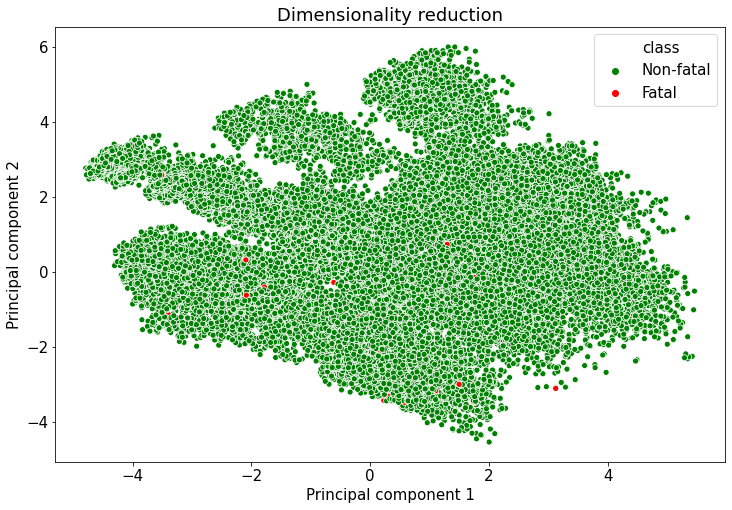

In [17]:
transfxn.pca_plot_labeled(X_scaled, y, palette = ['g', 'r'])